In [0]:
from pyspark import *
from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.sql.window import *
import pandas as pd

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [0]:
df = spark.table("workspace.springboard.cleaned_netflix_titles")



In [0]:
display(df)

show_id,type,duration_time,duration_unit,title,director,cast,country,date_added,release_year,rating,genre,description
s2,TV Show,2,Seasons,Blood & Water,NOT KNOWN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,September 24 2021,2021,TV-MA,"[""International TV Shows"","" TV Dramas"","" TV Mysteries""]","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,1,Season,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",UNKNOWN,September 24 2021,2021,TV-MA,"[""Crime TV Shows"","" International TV Shows"","" TV Action & Adventure""]","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s5,TV Show,2,Seasons,Kota Factory,NOT KNOWN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,September 24 2021,2021,TV-MA,"[""International TV Shows"","" Romantic TV Shows"","" TV Comedies""]","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,1,Season,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",UNKNOWN,September 24 2021,2021,TV-MA,"[""TV Dramas"","" TV Horror"","" TV Mysteries""]","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s7,Movie,91,min,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, Sofia Carson, Liza Koshy, Ken Jeong, Elizabeth Perkins, Jane Krakowski, Michael McKean, Phil LaMarr",UNKNOWN,September 24 2021,2021,PG,"[""Children & Family Movies""]","Equestria's divided. But a bright-eyed hero believes Earth Ponies, Pegasi and Unicorns should be pals — and, hoof to heart, she’s determined to prove it."
s8,Movie,125,min,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",United States Ghana Burkina Faso United Kingdom Germany Ethiopia,September 24 2021,1993,TV-MA,"[""Dramas"","" Independent Movies"","" International Movies""]","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s9,TV Show,9,Seasons,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,September 24 2021,2021,TV-14,"[""British TV Shows"","" Reality TV""]","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best."
s10,Movie,104,min,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, Kimberly Quinn, Loretta Devine, Ravi Kapoor",United States,September 24 2021,2021,PG-13,"[""Comedies"","" Dramas""]",A woman adjusting to life after a loss contends with a feisty bird that's taken over her garden — and a husband who's struggling to find a way forward.
s12,TV Show,1,Season,Bangkok Breaking,Kongkiat Komesiri,"Sukollawat Kanarot, Sushar Manaying, Pavarit Mongkolpisit, Sahajak Boonthanakit, Suthipongse Thatphithakkul, 

In [0]:
df = df.replace(['NOT KNOWN', 'UNKNOWN'], 'Not Found')
display(df)

show_id,type,duration_time,duration_unit,title,director,cast,country,date_added,release_year,rating,genre,description
s2,TV Show,2,Seasons,Blood & Water,Not Found,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,September 24 2021,2021,TV-MA,"[""International TV Shows"","" TV Dramas"","" TV Mysteries""]","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,1,Season,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",Not Found,September 24 2021,2021,TV-MA,"[""Crime TV Shows"","" International TV Shows"","" TV Action & Adventure""]","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s5,TV Show,2,Seasons,Kota Factory,Not Found,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,September 24 2021,2021,TV-MA,"[""International TV Shows"","" Romantic TV Shows"","" TV Comedies""]","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,1,Season,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",Not Found,September 24 2021,2021,TV-MA,"[""TV Dramas"","" TV Horror"","" TV Mysteries""]","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s7,Movie,91,min,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, Sofia Carson, Liza Koshy, Ken Jeong, Elizabeth Perkins, Jane Krakowski, Michael McKean, Phil LaMarr",Not Found,September 24 2021,2021,PG,"[""Children & Family Movies""]","Equestria's divided. But a bright-eyed hero believes Earth Ponies, Pegasi and Unicorns should be pals — and, hoof to heart, she’s determined to prove it."
s8,Movie,125,min,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",United States Ghana Burkina Faso United Kingdom Germany Ethiopia,September 24 2021,1993,TV-MA,"[""Dramas"","" Independent Movies"","" International Movies""]","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s9,TV Show,9,Seasons,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,September 24 2021,2021,TV-14,"[""British TV Shows"","" Reality TV""]","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best."
s10,Movie,104,min,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, Kimberly Quinn, Loretta Devine, Ravi Kapoor",United States,September 24 2021,2021,PG-13,"[""Comedies"","" Dramas""]",A woman adjusting to life after a loss contends with a feisty bird that's taken over her garden — and a husband who's struggling to find a way forward.
s12,TV Show,1,Season,Bangkok Breaking,Kongkiat Komesiri,"Sukollawat Kanarot, Sushar Manaying, Pavarit Mongkolpisit, Sahajak Boonthanakit, Suthipongse Thatphitha

In [0]:

df = df.withColumn('genre', array(col('genre')))

In [0]:
df.printSchema()

root
 |-- show_id: string (nullable = true)
 |-- type: string (nullable = true)
 |-- duration_time: long (nullable = true)
 |-- duration_unit: string (nullable = true)
 |-- title: string (nullable = true)
 |-- director: string (nullable = true)
 |-- cast: string (nullable = true)
 |-- country: string (nullable = true)
 |-- date_added: string (nullable = true)
 |-- release_year: long (nullable = true)
 |-- rating: string (nullable = true)
 |-- genre: array (nullable = false)
 |    |-- element: string (containsNull = true)
 |-- description: string (nullable = true)



# **Exploratory Data Analysis**

# Content Growth Over Time

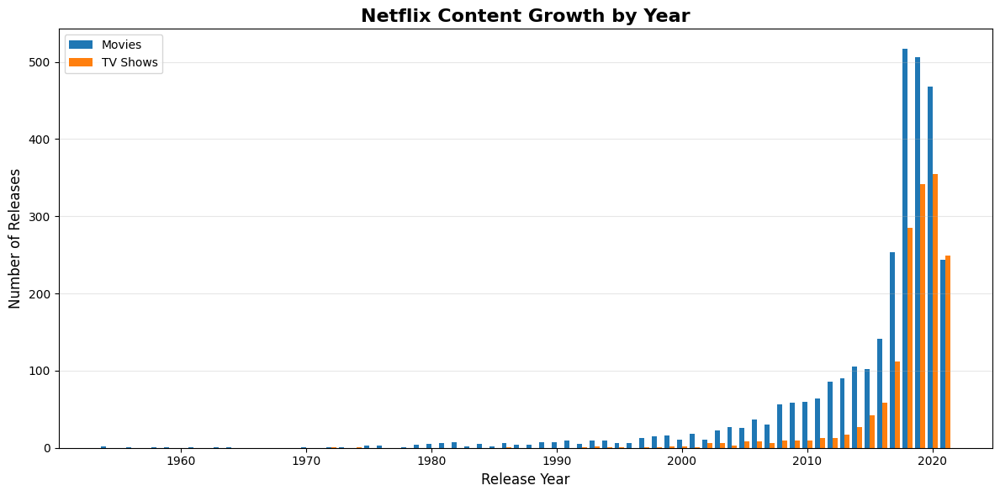

In [0]:
import matplotlib.pyplot as plt

content_trend = (
    df.groupBy(['release_year', 'type'])
    .count()
    .withColumnRenamed('count', 'count')
)

content_trend_pd = content_trend.toPandas()

trend_pivot = (
    content_trend_pd.pivot(
        index='release_year',
        columns='type',
        values='count'
    ).fillna(0)
)

plt.figure(figsize=(12, 6))
bar_width = 0.4
years = trend_pivot.index.astype(int)
movies = trend_pivot.get('Movie', 0)
tv_shows = trend_pivot.get('TV Show', 0)

plt.bar(years - bar_width/2, movies, width=bar_width, label='Movies')
plt.bar(years + bar_width/2, tv_shows, width=bar_width, label='TV Shows')

plt.title("Netflix Content Growth by Year", fontsize=16, fontweight='bold')
plt.xlabel("Release Year", fontsize=12)
plt.ylabel("Number of Releases", fontsize=12)
plt.legend()
plt.grid(alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# Distribution Analysis

type,count
Movie,3101
TV Show,1593


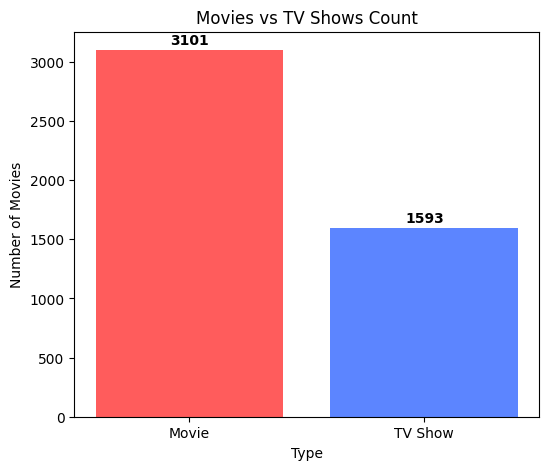

In [0]:

type_count_df = df.groupBy("type").count().orderBy("count", ascending=False)


display(type_count_df)
import matplotlib.pyplot as plt

pandas_df = type_count_df.toPandas()


plt.figure(figsize=(6, 5))
plt.bar(pandas_df['type'], pandas_df['count'], color=['#FF5C5C', '#5C85FF'])
plt.title('Movies vs TV Shows Count')
plt.xlabel('Type')
plt.ylabel('Number of Movies')


for i, val in enumerate(pandas_df['count']):
    plt.text(i, val + 50, str(val), ha='center', fontweight='bold')

plt.show()


In [0]:
release_count_df = df.groupBy("release_year").count().orderBy("release_year")
display(release_count_df)


release_year,count
1954,2
1956,1
1958,1
1959,1
1961,1
1963,1
1964,1
1970,1
1972,2
1973,1


genre,count
International Movies,1608
Dramas,1372
Comedies,984
International TV Shows,868
TV Dramas,528
Action & Adventure,438
TV Comedies,406
Romantic Movies,384
Independent Movies,360
Children & Family Movies,346


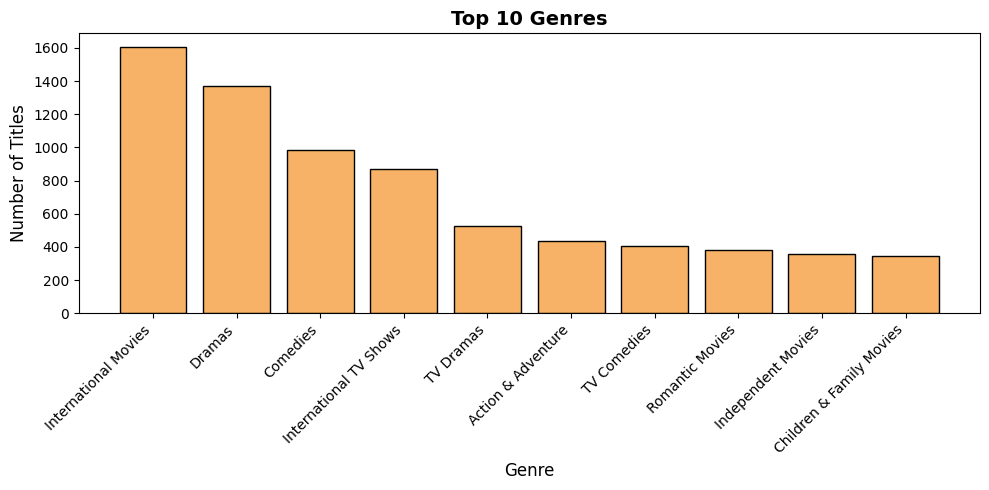

In [0]:
genre_df = (
    df
    .withColumn(
        "genre_clean",
        regexp_replace(col("genre").cast("string"), r"[\[\]\(\)\{\}\"'`]+", "")
    )
    .withColumn("genre_clean", regexp_replace(col("genre_clean"), r"\s*,\s*", ","))
    .withColumn("genre", explode(split(col("genre_clean"), ",")))
    .withColumn("genre", trim(col("genre")))
    .filter(col("genre") != "")
    .drop("genre_clean")
)

top_genres = genre_df.groupBy("genre").count().orderBy("count", ascending=False).limit(10)
display(top_genres)

genre_pd = top_genres.toPandas()

plt.figure(figsize=(10, 5))
plt.bar(genre_pd['genre'], genre_pd['count'], color='#F7B267', edgecolor='black')
plt.title('Top 10 Genres', fontsize=14, fontweight='bold')
plt.xlabel('Genre', fontsize=12)
plt.ylabel('Number of Titles', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


genre,type,count
International Movies,Movie,1608
Dramas,Movie,1372
Comedies,Movie,984
International TV Shows,TV Show,868
TV Dramas,TV Show,528
Action & Adventure,Movie,438
TV Comedies,TV Show,406
Romantic Movies,Movie,384
Independent Movies,Movie,360
Children & Family Movies,Movie,346


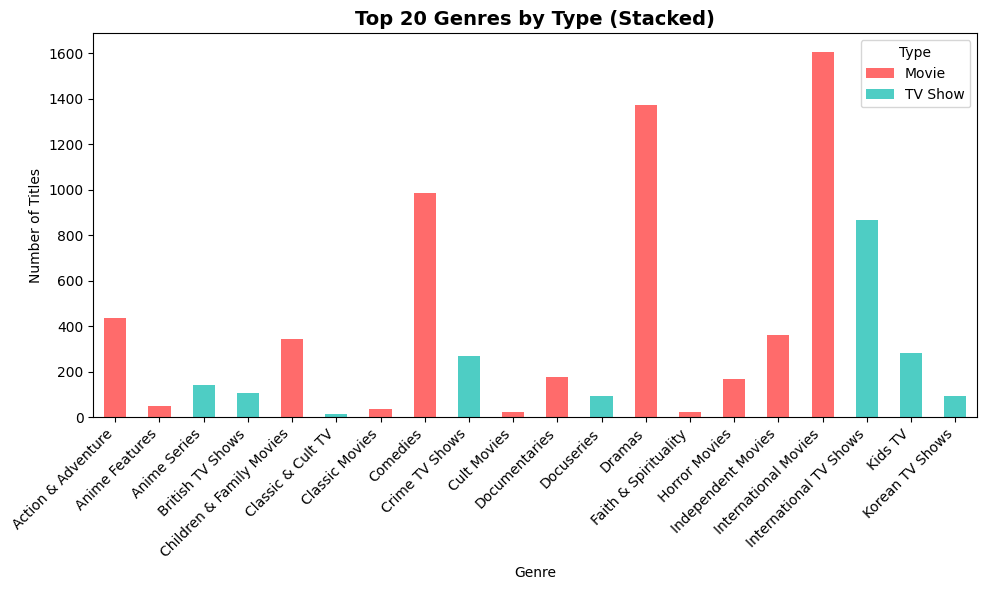

In [0]:


genre_type_df = genre_df.groupBy("genre", "type").count().orderBy("count", ascending=False)
display(genre_type_df)

genre_type_pd = genre_type_df.toPandas().pivot(index='genre', columns='type', values='count').fillna(0)

genre_type_pd = genre_type_pd.head(20)

genre_type_pd.plot(kind='bar', stacked=True, figsize=(10,6), color=['#FF6B6B', '#4ECDC4'])
plt.title('Top 20 Genres by Type (Stacked)', fontsize=14, fontweight='bold')
plt.xlabel('Genre')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Type')
plt.tight_layout()
plt.show()


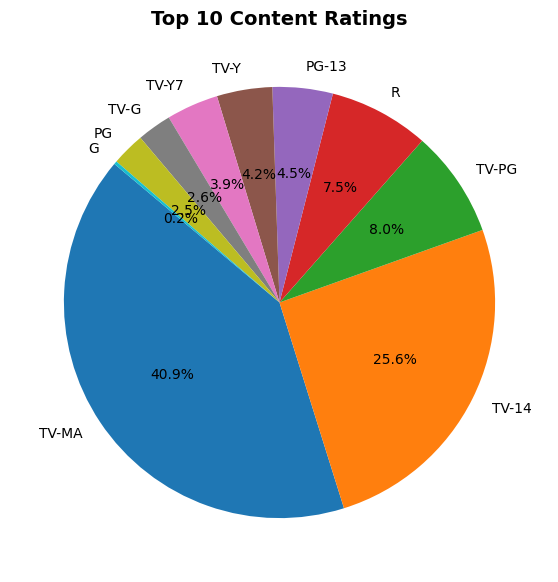

In [0]:
rating_df = df.groupBy("rating").count().orderBy("count", ascending=False).limit(10)
rating_pd = rating_df.toPandas()

plt.figure(figsize=(7,7))
plt.pie(rating_pd['count'], labels=rating_pd['rating'], autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Content Ratings', fontsize=14, fontweight='bold')
plt.show()


## Country-Level Analysis

In [0]:
display(df)

show_id,type,duration_time,duration_unit,title,director,cast,country,date_added,release_year,rating,genre,description
s2,TV Show,2,Seasons,Blood & Water,Not Found,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,September 24 2021,2021,TV-MA,"List([""International TV Shows"","" TV Dramas"","" TV Mysteries""])","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,1,Season,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",Not Found,September 24 2021,2021,TV-MA,"List([""Crime TV Shows"","" International TV Shows"","" TV Action & Adventure""])","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s5,TV Show,2,Seasons,Kota Factory,Not Found,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,September 24 2021,2021,TV-MA,"List([""International TV Shows"","" Romantic TV Shows"","" TV Comedies""])","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,1,Season,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",Not Found,September 24 2021,2021,TV-MA,"List([""TV Dramas"","" TV Horror"","" TV Mysteries""])","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s7,Movie,91,min,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, Sofia Carson, Liza Koshy, Ken Jeong, Elizabeth Perkins, Jane Krakowski, Michael McKean, Phil LaMarr",Not Found,September 24 2021,2021,PG,"List([""Children & Family Movies""])","Equestria's divided. But a bright-eyed hero believes Earth Ponies, Pegasi and Unicorns should be pals — and, hoof to heart, she’s determined to prove it."
s8,Movie,125,min,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",United States Ghana Burkina Faso United Kingdom Germany Ethiopia,September 24 2021,1993,TV-MA,"List([""Dramas"","" Independent Movies"","" International Movies""])","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s9,TV Show,9,Seasons,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,September 24 2021,2021,TV-14,"List([""British TV Shows"","" Reality TV""])","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best."
s10,Movie,104,min,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, Kimberly Quinn, Loretta Devine, Ravi Kapoor",United States,September 24 2021,2021,PG-13,"List([""Comedies"","" Dramas""])",A woman adjusting to life after a loss contends with a feisty bird that's taken over her garden — and a husband who's struggling to find a way forward.
s12,TV Show,1,Season,Bangkok Breaking,Kongkiat Komesiri,"Sukollawat Kanarot, Sushar Manaying, Pavarit Mongkolpis

country,count
United States,1271
India,567
Not Found,523
Japan,189
United Kingdom,158
South Korea,134
Spain,91
Nigeria,80
Canada,78
France,70


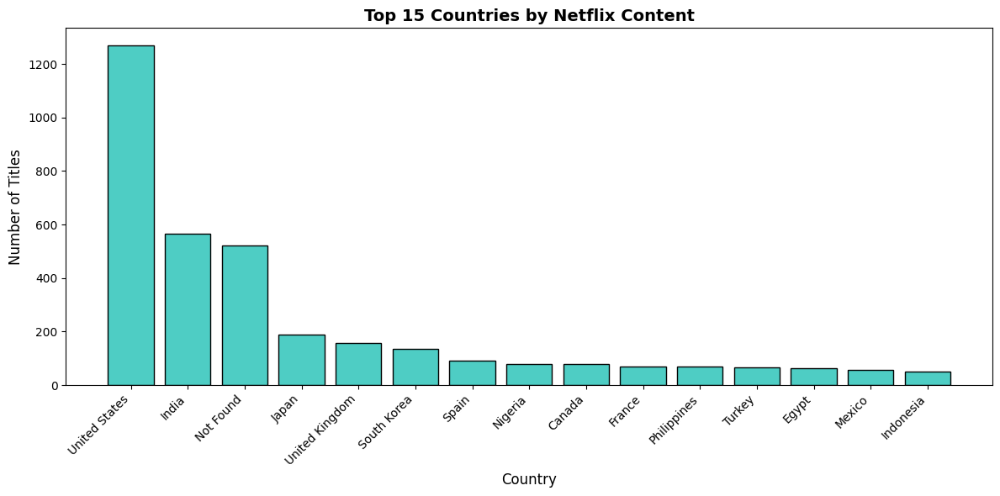

In [0]:
from pyspark.sql.functions import explode, trim

from pyspark.sql.functions import split, explode, trim, col

country_df = (
    df
    .withColumn("country", split(col("country"), ","))
    .withColumn("country", explode(col("country")))
    .withColumn("country", trim(col("country")))
    .filter(col("country") != "")
)

top_countries = (
    country_df.groupBy("country")
    .count()
    .orderBy("count", ascending=False)
    .limit(15)
)

display(top_countries)


top_countries_pd = top_countries.toPandas()

plt.figure(figsize=(12, 6))
plt.bar(top_countries_pd['country'], top_countries_pd['count'], color='#4ECDC4', edgecolor='black')
plt.title('Top 15 Countries by Netflix Content', fontsize=14, fontweight='bold')
plt.xlabel('Country', fontsize=12)
plt.ylabel('Number of Titles', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

try:
    import plotly.express as px
    import pycountry

    def get_country_code(name):
        try:
            return pycountry.countries.lookup(name).alpha_3
        except:
            return None

    top_countries_pd['iso_alpha'] = top_countries_pd['country'].apply(get_country_code)
    map_df = top_countries_pd.dropna(subset=['iso_alpha'])

    fig = px.choropleth(
        map_df,
        locations="iso_alpha",
        color="count",
        hover_name="country",
        color_continuous_scale=px.colors.sequential.Plasma,
        title="Netflix Content by Country (Top 15)"
    )
    fig.show()
except Exception as e:
    pass